In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import csv
from datetime import datetime
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
%cd "/content/drive/MyDrive/"

/content/drive/MyDrive


In [ ]:
df = pd.read_csv('Residential-Apartment Burglaries 2001 to Present.csv')

In [ ]:
df.head()

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,...,Ward,Community Area,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location
0,11695116,JC272771,05/21/2019 08:20:00 AM,018XX S CALIFORNIA AVE,620,BURGLARY,UNLAWFUL ENTRY,RESIDENCE,False,False,...,25.0,29.0,5,1157982.0,1890961.0,2019,01/19/2024 03:40:50 PM,41.856547,-87.695605,"(41.856547057, -87.695604526)"
1,13003649,JG177593,02/22/2023 01:50:00 PM,070XX S CLYDE AVE,610,BURGLARY,FORCIBLE ENTRY,RESIDENCE - PORCH / HALLWAY,True,False,...,5.0,43.0,5,1191427.0,1858753.0,2023,01/19/2024 03:40:50 PM,41.767419,-87.573890,"(41.767419224, -87.573890196)"
2,6680276,HP754070,12/27/2008 08:00:00 PM,058XX N MANTON AVE,610,BURGLARY,FORCIBLE ENTRY,RESIDENCE - GARAGE,False,False,...,39.0,11.0,5,1137225.0,1938474.0,2008,01/19/2024 03:40:50 PM,41.987326,-87.770650,"(41.9873259, -87.770650405)"
3,13340870,JH118913,12/07/2023 01:00:00 AM,050XX N BROADWAY,620,BURGLARY,UNLAWFUL ENTRY,APARTMENT,False,False,...,47.0,3.0,5,1167398.0,1933847.0,2023,01/19/2024 03:40:50 PM,41.974032,-87.659807,"(41.974031676, -87.659806667)"
4,13202865,JG414581,09/06/2023 06:00:00 PM,020XX S MICHIGAN AVE,610,BURGLARY,FORCIBLE ENTRY,APARTMENT,False,False,...,3.0,33.0,5,1177528.0,1890620.0,2023,09/14/2023 03:43:09 PM,41.855191,-87.623871,"(41.855190551, -87.623871195)"


In [ ]:
# Drop the rows where location is not included
df = df.dropna(subset=['Longitude'])

In [ ]:
# Takes in a date and returns how far it is from January 1, 2001 12:00:00 AM in seconds
# Date must be string in AM/PM format, not 24 hour format
# Tested, works
def date_to_seconds(date):
  j_2001 = "01/01/2001 12:00:00 AM"
  format_string = "%m/%d/%Y %I:%M:%S %p"
  date1 = datetime.strptime(date, format_string) # Object for date inputted into function
  og_date = datetime.strptime(j_2001, format_string) # Original date object Jan 1, 2001
  seconds_str = (date1 - og_date).total_seconds()
  seconds = float(seconds_str)
  return seconds

In [ ]:
# Takes DataFrame object and turns all the dates into seconds from Jan 1, 2001 12 AM in seconds
# Tested, works
def modify_dates(data_frame):
  for i in range(data_frame.shape[0]):
    date_string = data_frame.loc[i, "Date"]
    num_seconds = date_to_seconds(date_string)
    data_frame.loc[i, "Date"] = num_seconds

In [ ]:
print(df.loc[1, "Date"])

02/22/2023 01:50:00 PM


In [ ]:
x_min, x_max = -87.9, -87.5
y_min, y_max = 41.6, 42.1

In [ ]:
# Creates scatterplot of locations of crime
def scatterplot(frame):
  plt.xlim(x_min, x_max)
  plt.ylim(y_min, y_max)
  plt.scatter(frame['Longitude'], frame['Latitude'])
  plt.show()

In [ ]:
# Creates list of DataFrames for each year from 2001 to 2025 inclusive
df_by_year = []
for year in range(2001, 2026):
  df_by_year.append(df[df['Year'] == year])
for frame in df_by_year:
  scatterplot(frame)

In [33]:
# Test 10:24 am 10/21/25
df['Timestamp'] = pd.to_datetime(df['Date']).astype('int64') // 10 ** 9

features = df[['Longitude', 'Latitude', 'Timestamp']]

scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)

In [34]:
k = 15
model = KMeans(n_clusters=k, init='random', n_init=10)
clusters = model.fit_predict(scaled_features)


df['Cluster'] = clusters

In [28]:
k = 15
model = KMeans(n_clusters=k, init='random', n_init=10)
clusters = model.fit_predict(df[['Longitude', 'Latitude']])


df['Cluster'] = clusters

In [29]:
import plotly.express as px
# fig = px.density_map(df, lat='Latitude', lon='Longitude', z='Cluster', center=dict(lat=y_min, lon=x_min), zoom=11, map_style="open-street-map")

In [ ]:
fig = px.scatter_mapbox(df, lat="Latitude", lon="Longitude", color="Cluster", animation_frame="Date", color_continuous_scale=px.colors.sequential.Viridis, zoom=11, height=500, title="Crime Cluster Evolution Over Time")

In [31]:
fig.update_layout(mapbox_style="open-street-map")

In [ ]:
df['Cluster']

,Cluster
0,0
1,1
2,2
3,2
4,0
...,...
353738,0
353740,1
353741,1
353742,1


In [ ]:
df['Cluster']

,Cluster
0,0
1,1
2,2
3,2
4,0
...,...
353738,0
353740,1
353741,1
353742,1


In [ ]:
year_counts = df['Year'].value_counts()
print(type(year_counts))
print(year_counts[2011])
years = [x for x in range(2001, 2026)]
counts = [year_counts[x] for x in years]

<class 'pandas.core.series.Series'>
22690


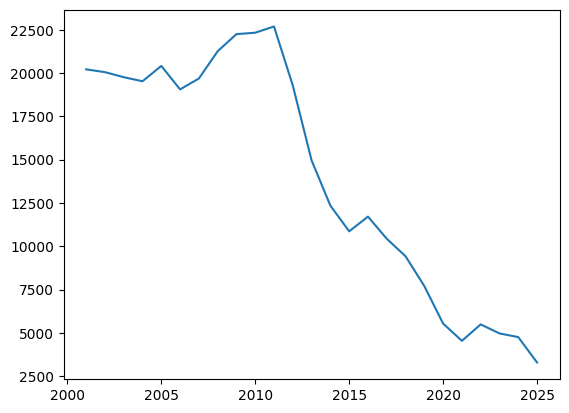

In [ ]:
# Number of crimes in Chicago each year
plt.plot(years, counts)